In [1]:
import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

bif_c = 0.1
num_iter_max=200000
alpha=0.2
# alpha=0.5
# alpha=0.8 # predict diverge
# vae_lr=1e-5
vae_lr=5e-4
ratio_lr=5e-4
ratio_early=100
env_name = 'CustomPendulum-v0'
figfilenamehead = "fig_policy_optimization_pendulum_A_"

loss_list = []
normalized_loss_list = []

In [2]:
import gym
import custom_gym
env = gym.make(env_name)

seed = 0
env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = 1
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
# agent = SAC(env.observation_space.shape[0], env.action_space)
agent = SAC(env.observation_space.shape[0]+z_dim*2, env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_pendulum_bamdp_standardvae_")


offline_data = pickle.load(open("offline_data.pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info.pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_bamdp_standardvae_


In [4]:
args_init_dict = {"offline_data": offline_data,
             "s_dim": s_dim,
             "a_dim": a_dim,
             "z_dim": z_dim,
#              "policy":agent.select_action,
             "mdp_policy":None,
             "bamdp_policy":agent.policy.my_np_select_action,
                  "debug_info":debug_info,
                  "env" : env}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base()
iwvi.update_mulogvar_offlinedata()

load vi_base_ckpt


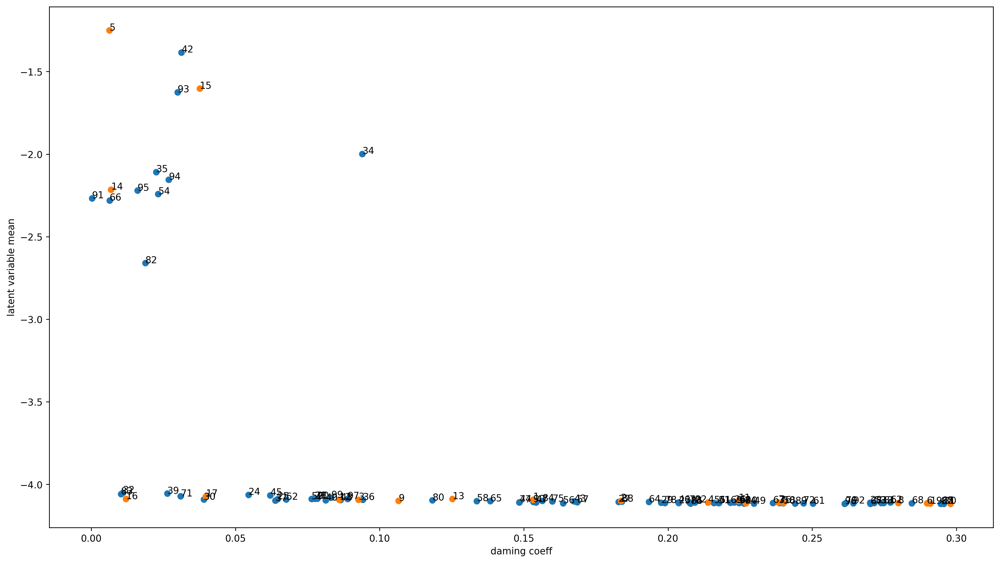

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.xlim([0.06,0.14])
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_bamdppolicy_data()

In [7]:
# fig = plt.figure(figsize=(18,10))
# ax_list = []
# for i in range(50):
#     ax_list.append(fig.add_subplot(5, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1]) 
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1]) 
# print("オフラインデータvs実環境方策rollout")

In [8]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter0.png")
plt.savefig(figfilenamehead+"iter0.pdf")
plt.savefig(figfilenamehead+"iter0.eps")
print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-03-25 12:51:46.834455


# Iter 1

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
get_belief:  [-4.134363 -7.376524] iter 85 len 129 compute_time 0.0619 best_loss -421 loss.item() -417           
 1
get_belief:  [-4.066791  -7.7932024] iter 91 len 168 compute_time 0.0651 best_loss -527 loss.item() -527         
 2


In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# for i in range(100):
#     print(i, " ", end="")
#     fig = plt.figure(figsize=(16,10), dpi=150)
#     fig.patch.set_facecolor('white')
#     plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#                vmin=-8, vmax=3
#                )
#     plt.colorbar()
#     plt.savefig("ratio"+str(i)+".png")
#     plt.close()

In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter1.png")
plt.savefig(figfilenamehead+"iter1.eps")
plt.savefig(figfilenamehead+"iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter2

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter 3

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)



In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# i = 49
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

train_weighted_vae: enc_dec
train: iter 0  trainloss -64.14879  validloss -65.90627±0.00000  bestvalidloss -65.90627  last_update 0
train: iter 1  trainloss -66.96570  validloss -52.47388±0.00000  bestvalidloss -65.90627  last_update 1
train: iter 2  trainloss -67.71641  validloss -61.46799±0.00000  bestvalidloss -65.90627  last_update 2
train: iter 3  trainloss -68.05935  validloss -54.08296±0.00000  bestvalidloss -65.90627  last_update 3
train: iter 4  trainloss -67.17962  validloss -55.07789±0.00000  bestvalidloss -65.90627  last_update 4
train: iter 5  trainloss -68.83940  validloss -50.31089±0.00000  bestvalidloss -65.90627  last_update 5
train: iter 6  trainloss -64.83433  validloss -39.64135±0.00000  bestvalidloss -65.90627  last_update 6
train: iter 7  trainloss -68.50348  validloss -57.65423±0.00000  bestvalidloss -65.90627  last_update 7
train: iter 8  trainloss -68.37864  validloss -63.32236±0.00000  bestvalidloss -65.90627  last_update 8
train: iter 9  trainloss -7.18094  v

train: iter 78  trainloss -65.24145  validloss -29.61917±0.00000  bestvalidloss -67.34643  last_update 43
train: iter 79  trainloss -65.74403  validloss -24.66945±0.00000  bestvalidloss -67.34643  last_update 44
train: iter 80  trainloss -65.11230  validloss -48.65446±0.00000  bestvalidloss -67.34643  last_update 45
train: iter 81  trainloss -67.10261  validloss -58.63783±0.00000  bestvalidloss -67.34643  last_update 46
train: iter 82  trainloss -65.75677  validloss -55.34335±0.00000  bestvalidloss -67.34643  last_update 47
train: iter 83  trainloss -65.95216  validloss -52.42117±0.00000  bestvalidloss -67.34643  last_update 48
train: iter 84  trainloss -64.40021  validloss -71.16637±0.00000  bestvalidloss -71.16637  last_update 0
train: iter 85  trainloss -67.48458  validloss -50.60603±0.00000  bestvalidloss -71.16637  last_update 1
train: iter 86  trainloss -62.95724  validloss -53.11531±0.00000  bestvalidloss -71.16637  last_update 2
train: iter 87  trainloss -67.94828  validloss -5

train: iter 155  trainloss -63.33869  validloss -30.57915±0.00000  bestvalidloss -71.16637  last_update 71
train: iter 156  trainloss -66.51683  validloss -31.91556±0.00000  bestvalidloss -71.16637  last_update 72
train: iter 157  trainloss -66.09267  validloss -38.01601±0.00000  bestvalidloss -71.16637  last_update 73
train: iter 158  trainloss -66.03236  validloss -44.56996±0.00000  bestvalidloss -71.16637  last_update 74
train: iter 159  trainloss -69.33460  validloss -46.72980±0.00000  bestvalidloss -71.16637  last_update 75
train: iter 160  trainloss -67.50703  validloss -47.77957±0.00000  bestvalidloss -71.16637  last_update 76
train: iter 161  trainloss -66.91241  validloss -22.06169±0.00000  bestvalidloss -71.16637  last_update 77
train: iter 162  trainloss -64.66502  validloss -30.78635±0.00000  bestvalidloss -71.16637  last_update 78
train: iter 163  trainloss -66.64495  validloss -57.86514±0.00000  bestvalidloss -71.16637  last_update 79
train: iter 164  trainloss -67.77270 

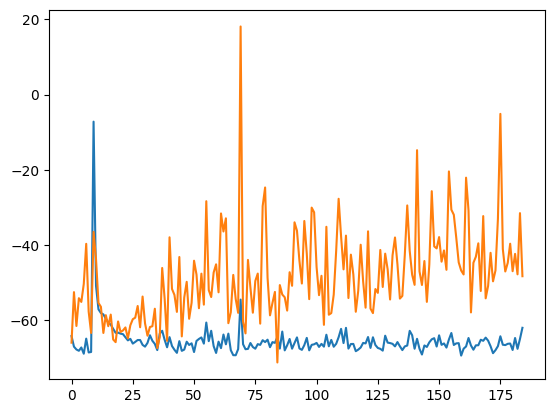

train_weighted_vae: enc
train: iter 0  trainloss -62.94969  validloss -47.67528±0.00000  bestvalidloss -47.67528  last_update 0
train: iter 1  trainloss -62.63816  validloss -41.04722±0.00000  bestvalidloss -47.67528  last_update 1
train: iter 2  trainloss -61.39669  validloss -36.28371±0.00000  bestvalidloss -47.67528  last_update 2
train: iter 3  trainloss -62.28961  validloss -37.93450±0.00000  bestvalidloss -47.67528  last_update 3
train: iter 4  trainloss -63.46089  validloss -35.21457±0.00000  bestvalidloss -47.67528  last_update 4
train: iter 5  trainloss -62.59390  validloss -37.96288±0.00000  bestvalidloss -47.67528  last_update 5
train: iter 6  trainloss -62.70152  validloss -38.08177±0.00000  bestvalidloss -47.67528  last_update 6
train: iter 7  trainloss -61.94711  validloss -49.56404±0.00000  bestvalidloss -49.56404  last_update 0
train: iter 8  trainloss -63.30382  validloss -47.96745±0.00000  bestvalidloss -49.56404  last_update 1
train: iter 9  trainloss -62.74505  vali

train: iter 78  trainloss -62.12343  validloss -48.54362±0.00000  bestvalidloss -56.87947  last_update 60
train: iter 79  trainloss -62.69148  validloss -51.25664±0.00000  bestvalidloss -56.87947  last_update 61
train: iter 80  trainloss -63.27005  validloss -48.58434±0.00000  bestvalidloss -56.87947  last_update 62
train: iter 81  trainloss -63.56621  validloss -44.95343±0.00000  bestvalidloss -56.87947  last_update 63
train: iter 82  trainloss -63.42847  validloss -52.66651±0.00000  bestvalidloss -56.87947  last_update 64
train: iter 83  trainloss -62.57819  validloss -44.13881±0.00000  bestvalidloss -56.87947  last_update 65
train: iter 84  trainloss -60.28918  validloss -46.95593±0.00000  bestvalidloss -56.87947  last_update 66
train: iter 85  trainloss -63.87919  validloss -54.61046±0.00000  bestvalidloss -56.87947  last_update 67
train: iter 86  trainloss -61.36632  validloss -45.68090±0.00000  bestvalidloss -56.87947  last_update 68
train: iter 87  trainloss -62.30147  validloss

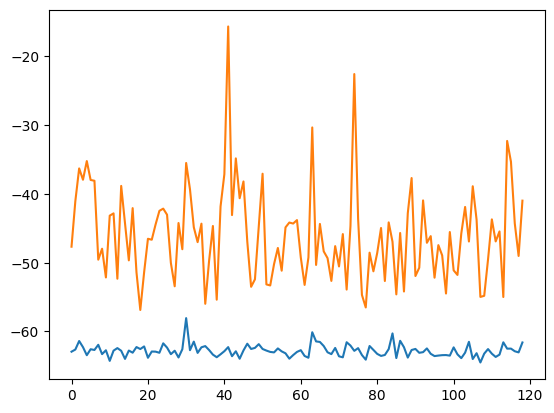

train_weighted_vae: dec
train: iter 0  trainloss -61.39948  validloss -30.95732±0.00000  bestvalidloss -30.95732  last_update 0
train: iter 1  trainloss -63.52412  validloss -49.27250±0.00000  bestvalidloss -49.27250  last_update 0
train: iter 2  trainloss -63.86264  validloss -40.46787±0.00000  bestvalidloss -49.27250  last_update 1
train: iter 3  trainloss -64.95791  validloss -37.52996±0.00000  bestvalidloss -49.27250  last_update 2
train: iter 4  trainloss -63.66826  validloss -43.85630±0.00000  bestvalidloss -49.27250  last_update 3
train: iter 5  trainloss -62.40388  validloss -41.58139±0.00000  bestvalidloss -49.27250  last_update 4
train: iter 6  trainloss -62.44064  validloss -37.75223±0.00000  bestvalidloss -49.27250  last_update 5
train: iter 7  trainloss -64.58832  validloss -47.71938±0.00000  bestvalidloss -49.27250  last_update 6
train: iter 8  trainloss -64.37483  validloss -31.33650±0.00000  bestvalidloss -49.27250  last_update 7
train: iter 9  trainloss -64.56150  vali

train: iter 78  trainloss -64.08855  validloss -35.74653±0.00000  bestvalidloss -51.80621  last_update 49
train: iter 79  trainloss -64.05117  validloss -43.03879±0.00000  bestvalidloss -51.80621  last_update 50
train: iter 80  trainloss -64.91719  validloss -31.78710±0.00000  bestvalidloss -51.80621  last_update 51
train: iter 81  trainloss -64.47093  validloss -35.17847±0.00000  bestvalidloss -51.80621  last_update 52
train: iter 82  trainloss -64.92320  validloss -41.04081±0.00000  bestvalidloss -51.80621  last_update 53
train: iter 83  trainloss -63.18537  validloss -37.01666±0.00000  bestvalidloss -51.80621  last_update 54
train: iter 84  trainloss -64.32205  validloss -40.70195±0.00000  bestvalidloss -51.80621  last_update 55
train: iter 85  trainloss -64.97708  validloss -45.91997±0.00000  bestvalidloss -51.80621  last_update 56
train: iter 86  trainloss -61.70040  validloss -45.13190±0.00000  bestvalidloss -51.80621  last_update 57
train: iter 87  trainloss -62.81636  validloss

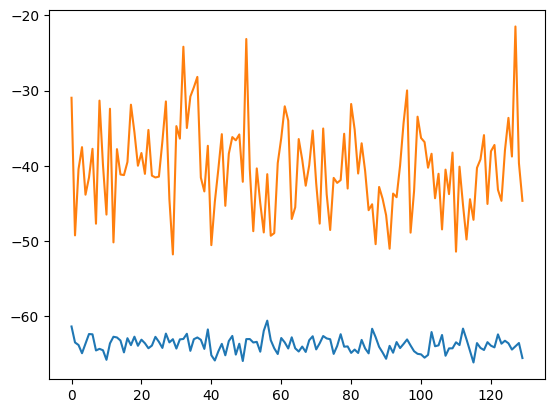

alpha 0.2 vae_lr 0.0005


In [38]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

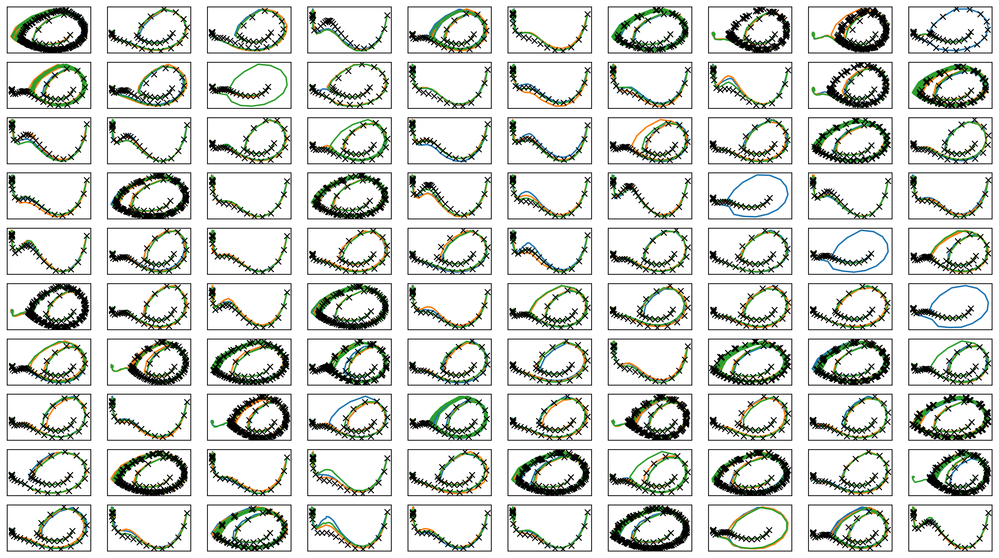

In [39]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

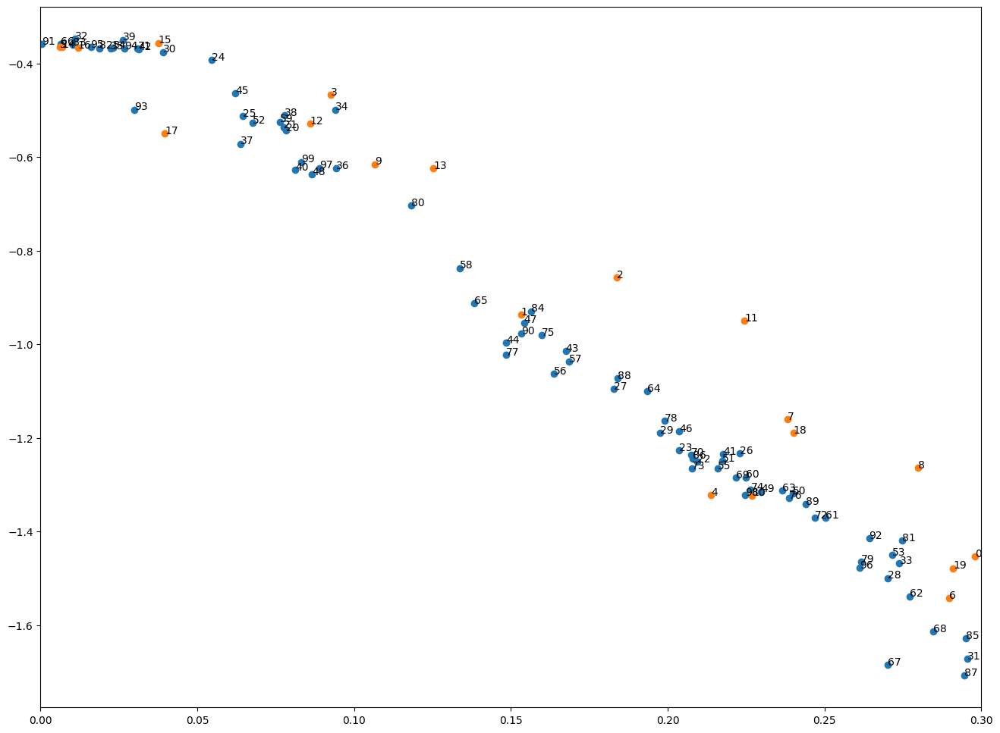

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [40]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [41]:
print(datetime.datetime.now())

2023-03-21 22:03:36.976135


# Iter 4

In [42]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [43]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 0.06135  validloss 0.10624±0.00000  bestvalidloss 0.10624  last_update 0
train: iter 1  trainloss 0.05159  validloss 0.07982±0.00000  bestvalidloss 0.07982  last_update 0
train: iter 2  trainloss 0.05017  validloss 0.07294±0.00000  bestvalidloss 0.07294  last_update 0
train: iter 3  trainloss 0.04874  validloss 0.06573±0.00000  bestvalidloss 0.06573  last_update 0
train: iter 4  trainloss 0.04796  validloss 0.06678±0.00000  bestvalidloss 0.06573  last_update 1
train: iter 5  trainloss 0.04507  validloss 0.06277±0.00000  bestvalidloss 0.06277  last_update 0
train: iter 6  trainloss 0.07134  validloss 0.06115±0.00000  bestvalidloss 0.06115  last_update 0
train: iter 7  trainloss 0.04886  validloss 0.08397±0.00000  bestvalidloss 0.06115  last_update 1
train: iter 8  trainloss 0.04344  validloss 0.06131±0.00000  bestvalidloss 0.06115  last_update 2
train: iter 9  trainloss 0.04419  validloss 0.06337±0.00000  bestvalidloss 0.06115  last_update 3
train: iter 10  trai

train: iter 84  trainloss 0.03945  validloss 0.05723±0.00000  bestvalidloss 0.05366  last_update 18
train: iter 85  trainloss 0.03989  validloss 0.05553±0.00000  bestvalidloss 0.05366  last_update 19
train: iter 86  trainloss 0.04070  validloss 0.05604±0.00000  bestvalidloss 0.05366  last_update 20
train: iter 87  trainloss 0.03959  validloss 0.05471±0.00000  bestvalidloss 0.05366  last_update 21
train: iter 88  trainloss 0.04135  validloss 0.05600±0.00000  bestvalidloss 0.05366  last_update 22
train: iter 89  trainloss 0.04035  validloss 0.05512±0.00000  bestvalidloss 0.05366  last_update 23
train: iter 90  trainloss 0.04182  validloss 0.05542±0.00000  bestvalidloss 0.05366  last_update 24
train: iter 91  trainloss 0.03976  validloss 0.05402±0.00000  bestvalidloss 0.05366  last_update 25
train: iter 92  trainloss 0.04100  validloss 0.05412±0.00000  bestvalidloss 0.05366  last_update 26
train: iter 93  trainloss 0.04065  validloss 0.05925±0.00000  bestvalidloss 0.05366  last_update 27


train: iter 167  trainloss 0.04393  validloss 0.05605±0.00000  bestvalidloss 0.05258  last_update 26
train: iter 168  trainloss 0.03825  validloss 0.05554±0.00000  bestvalidloss 0.05258  last_update 27
train: iter 169  trainloss 0.03828  validloss 0.05767±0.00000  bestvalidloss 0.05258  last_update 28
train: iter 170  trainloss 0.03721  validloss 0.05382±0.00000  bestvalidloss 0.05258  last_update 29
train: iter 171  trainloss 0.03835  validloss 0.05519±0.00000  bestvalidloss 0.05258  last_update 30
train: iter 172  trainloss 0.03813  validloss 0.05481±0.00000  bestvalidloss 0.05258  last_update 31
train: iter 173  trainloss 0.03785  validloss 0.05517±0.00000  bestvalidloss 0.05258  last_update 32
train: iter 174  trainloss 0.03866  validloss 0.05573±0.00000  bestvalidloss 0.05258  last_update 33
train: iter 175  trainloss 0.03850  validloss 0.05521±0.00000  bestvalidloss 0.05258  last_update 34
train: iter 176  trainloss 0.03783  validloss 0.05392±0.00000  bestvalidloss 0.05258  last_

In [44]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -131.791160466671
valid_loss:  -95.06642906367777
train_loss:  -72.02917483001947
valid_loss:  -48.91145352840424


1e-08 1000.0


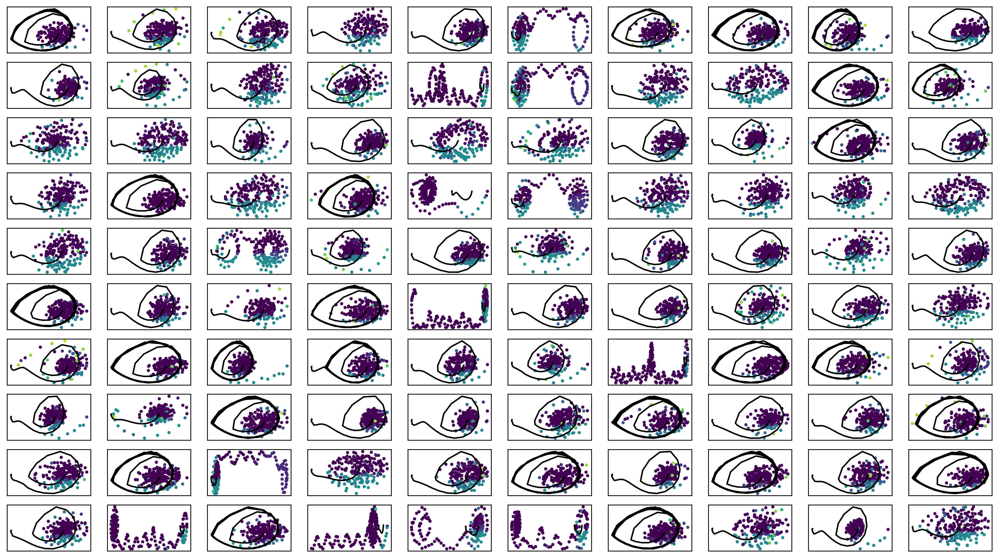

In [45]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter4.png")

In [46]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [47]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [48]:
# i = 35
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

train_weighted_vae: enc_dec
train: iter 0  trainloss -69.32637  validloss -47.83259±0.00000  bestvalidloss -47.83259  last_update 0
train: iter 1  trainloss -72.67908  validloss -56.58222±0.00000  bestvalidloss -56.58222  last_update 0
train: iter 2  trainloss -70.46808  validloss -61.27660±0.00000  bestvalidloss -61.27660  last_update 0
train: iter 3  trainloss -74.60665  validloss -57.68141±0.00000  bestvalidloss -61.27660  last_update 1
train: iter 4  trainloss -71.88856  validloss -36.24199±0.00000  bestvalidloss -61.27660  last_update 2
train: iter 5  trainloss -65.87131  validloss -35.90828±0.00000  bestvalidloss -61.27660  last_update 3
train: iter 6  trainloss -74.52870  validloss -58.47168±0.00000  bestvalidloss -61.27660  last_update 4
train: iter 7  trainloss -72.23748  validloss -53.01771±0.00000  bestvalidloss -61.27660  last_update 5
train: iter 8  trainloss -73.90298  validloss -50.78308±0.00000  bestvalidloss -61.27660  last_update 6
train: iter 9  trainloss -71.31492  

train: iter 78  trainloss -71.80511  validloss -50.34554±0.00000  bestvalidloss -69.25640  last_update 57
train: iter 79  trainloss -74.63163  validloss -48.04310±0.00000  bestvalidloss -69.25640  last_update 58
train: iter 80  trainloss -71.52985  validloss -39.07755±0.00000  bestvalidloss -69.25640  last_update 59
train: iter 81  trainloss -74.55349  validloss -45.94358±0.00000  bestvalidloss -69.25640  last_update 60
train: iter 82  trainloss -74.69288  validloss -56.11684±0.00000  bestvalidloss -69.25640  last_update 61
train: iter 83  trainloss -72.62593  validloss -44.58223±0.00000  bestvalidloss -69.25640  last_update 62
train: iter 84  trainloss -69.48689  validloss -23.54412±0.00000  bestvalidloss -69.25640  last_update 63
train: iter 85  trainloss -67.03838  validloss -5.73462±0.00000  bestvalidloss -69.25640  last_update 64
train: iter 86  trainloss -71.17842  validloss -45.40587±0.00000  bestvalidloss -69.25640  last_update 65
train: iter 87  trainloss -73.92203  validloss 

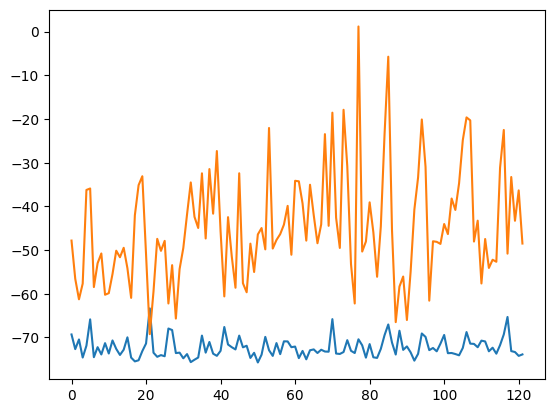

train_weighted_vae: enc
train: iter 0  trainloss -72.93649  validloss -52.15530±0.00000  bestvalidloss -52.15530  last_update 0
train: iter 1  trainloss -75.18188  validloss -40.82893±0.00000  bestvalidloss -52.15530  last_update 1
train: iter 2  trainloss -73.71578  validloss -33.59003±0.00000  bestvalidloss -52.15530  last_update 2
train: iter 3  trainloss -73.29408  validloss -34.14121±0.00000  bestvalidloss -52.15530  last_update 3
train: iter 4  trainloss -74.59338  validloss -44.24623±0.00000  bestvalidloss -52.15530  last_update 4
train: iter 5  trainloss -73.49801  validloss -53.40323±0.00000  bestvalidloss -53.40323  last_update 0
train: iter 6  trainloss -73.54451  validloss -34.62311±0.00000  bestvalidloss -53.40323  last_update 1
train: iter 7  trainloss -74.43342  validloss -47.68450±0.00000  bestvalidloss -53.40323  last_update 2
train: iter 8  trainloss -72.61271  validloss -54.77280±0.00000  bestvalidloss -54.77280  last_update 0
train: iter 9  trainloss -74.16956  vali

train: iter 78  trainloss -71.93849  validloss -33.00793±0.00000  bestvalidloss -57.03214  last_update 7
train: iter 79  trainloss -73.80990  validloss -53.38911±0.00000  bestvalidloss -57.03214  last_update 8
train: iter 80  trainloss -75.06376  validloss -28.60780±0.00000  bestvalidloss -57.03214  last_update 9
train: iter 81  trainloss -74.81345  validloss -49.67350±0.00000  bestvalidloss -57.03214  last_update 10
train: iter 82  trainloss -73.53806  validloss -15.14276±0.00000  bestvalidloss -57.03214  last_update 11
train: iter 83  trainloss -73.88185  validloss -36.89623±0.00000  bestvalidloss -57.03214  last_update 12
train: iter 84  trainloss -72.57029  validloss -53.77302±0.00000  bestvalidloss -57.03214  last_update 13
train: iter 85  trainloss -73.00819  validloss -42.98930±0.00000  bestvalidloss -57.03214  last_update 14
train: iter 86  trainloss -74.68859  validloss -39.38664±0.00000  bestvalidloss -57.03214  last_update 15
train: iter 87  trainloss -74.37644  validloss -4

train: iter 155  trainloss -74.14086  validloss -49.78338±0.00000  bestvalidloss -63.77518  last_update 49
train: iter 156  trainloss -74.02004  validloss -41.69278±0.00000  bestvalidloss -63.77518  last_update 50
train: iter 157  trainloss -75.11883  validloss -45.62909±0.00000  bestvalidloss -63.77518  last_update 51
train: iter 158  trainloss -74.77295  validloss -39.53857±0.00000  bestvalidloss -63.77518  last_update 52
train: iter 159  trainloss -74.40494  validloss -50.31072±0.00000  bestvalidloss -63.77518  last_update 53
train: iter 160  trainloss -73.33738  validloss -37.15800±0.00000  bestvalidloss -63.77518  last_update 54
train: iter 161  trainloss -73.88584  validloss -39.98622±0.00000  bestvalidloss -63.77518  last_update 55
train: iter 162  trainloss -72.91394  validloss -33.19777±0.00000  bestvalidloss -63.77518  last_update 56
train: iter 163  trainloss -71.94791  validloss -47.90337±0.00000  bestvalidloss -63.77518  last_update 57
train: iter 164  trainloss -74.29202 

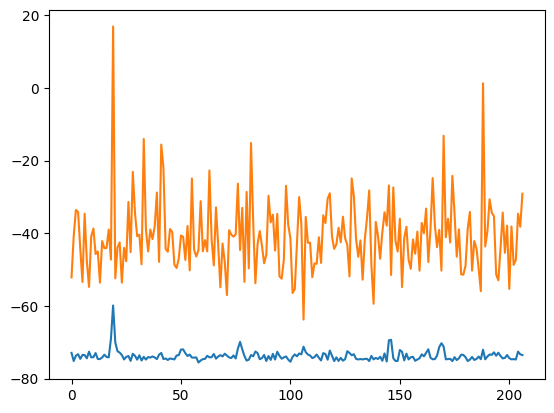

train_weighted_vae: dec
train: iter 0  trainloss -69.36678  validloss -34.63850±0.00000  bestvalidloss -34.63850  last_update 0
train: iter 1  trainloss -69.88581  validloss -46.46887±0.00000  bestvalidloss -46.46887  last_update 0
train: iter 2  trainloss -70.06655  validloss -53.34641±0.00000  bestvalidloss -53.34641  last_update 0
train: iter 3  trainloss -68.82786  validloss -48.97995±0.00000  bestvalidloss -53.34641  last_update 1
train: iter 4  trainloss -71.19734  validloss -44.30026±0.00000  bestvalidloss -53.34641  last_update 2
train: iter 5  trainloss -71.39295  validloss -46.73310±0.00000  bestvalidloss -53.34641  last_update 3
train: iter 6  trainloss -70.90207  validloss -51.81900±0.00000  bestvalidloss -53.34641  last_update 4
train: iter 7  trainloss -71.79091  validloss -53.89841±0.00000  bestvalidloss -53.89841  last_update 0
train: iter 8  trainloss -71.55299  validloss -57.29452±0.00000  bestvalidloss -57.29452  last_update 0
train: iter 9  trainloss -70.46771  vali

train: iter 78  trainloss -72.15097  validloss -46.02636±0.00000  bestvalidloss -60.21704  last_update 44
train: iter 79  trainloss -72.42361  validloss -55.01803±0.00000  bestvalidloss -60.21704  last_update 45
train: iter 80  trainloss -68.15118  validloss -3.94541±0.00000  bestvalidloss -60.21704  last_update 46
train: iter 81  trainloss -70.38208  validloss -53.05772±0.00000  bestvalidloss -60.21704  last_update 47
train: iter 82  trainloss -72.96563  validloss -55.32906±0.00000  bestvalidloss -60.21704  last_update 48
train: iter 83  trainloss -71.10238  validloss -50.64818±0.00000  bestvalidloss -60.21704  last_update 49
train: iter 84  trainloss -71.59669  validloss -46.47342±0.00000  bestvalidloss -60.21704  last_update 50
train: iter 85  trainloss -73.06102  validloss -49.17300±0.00000  bestvalidloss -60.21704  last_update 51
train: iter 86  trainloss -71.30062  validloss -56.80767±0.00000  bestvalidloss -60.21704  last_update 52
train: iter 87  trainloss -70.98903  validloss 

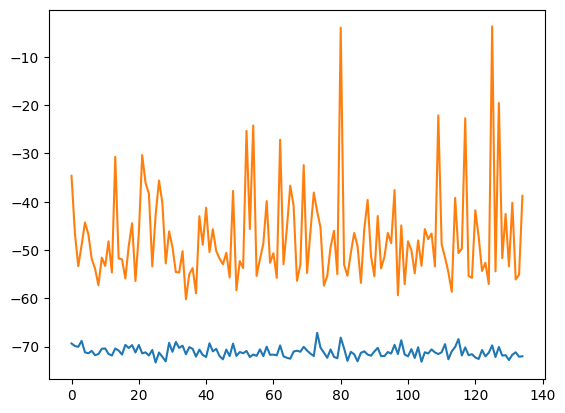

alpha 0.2 vae_lr 0.0005


In [49]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

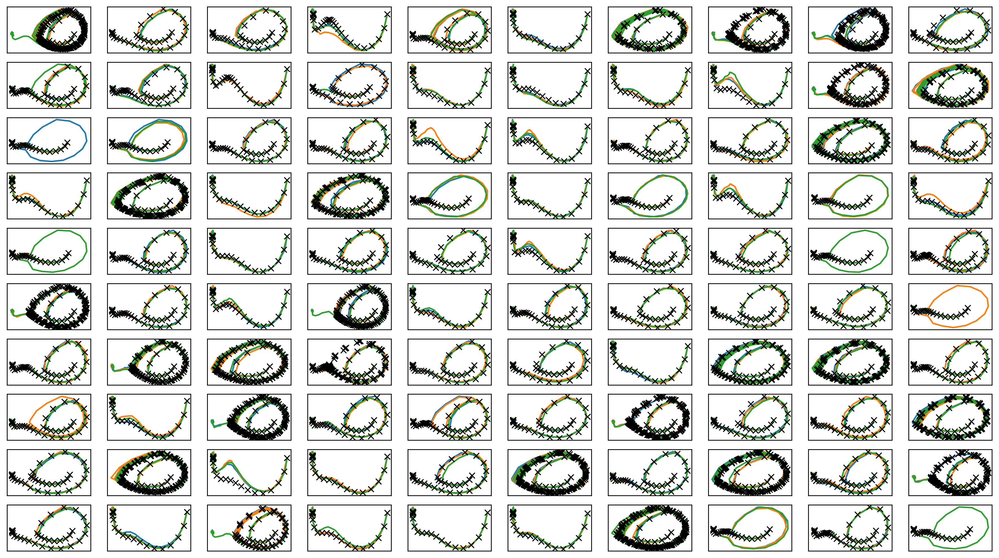

In [50]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter4.png")
plt.savefig(figfilenamehead+"joint_iter4.eps")
plt.savefig(figfilenamehead+"joint_iter4.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

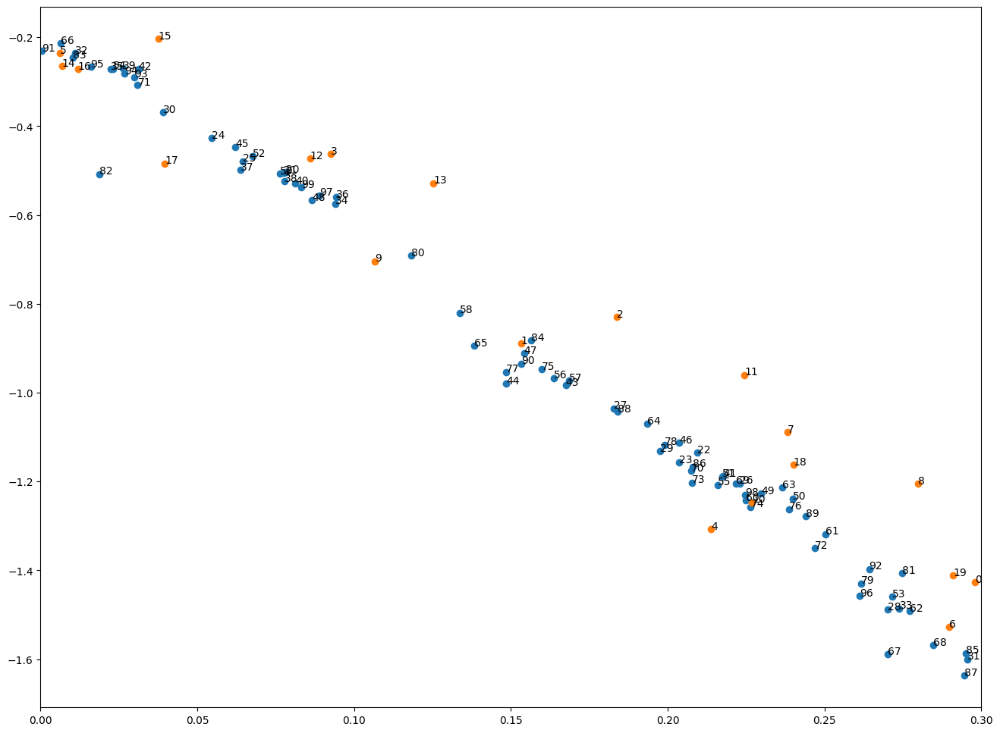

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [51]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter4.png")
plt.savefig(figfilenamehead+"damping_latent_iter4.eps")
plt.savefig(figfilenamehead+"damping_latent_iter4.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])

# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [52]:
print(datetime.datetime.now())

2023-03-21 22:08:38.137883


# Iter5

In [53]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [54]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

train: iter 0  trainloss 0.04969  validloss 0.06628±0.00000  bestvalidloss 0.06628  last_update 0
train: iter 1  trainloss 0.04587  validloss 0.05911±0.00000  bestvalidloss 0.05911  last_update 0
train: iter 2  trainloss 0.04267  validloss 0.05937±0.00000  bestvalidloss 0.05911  last_update 1
train: iter 3  trainloss 0.04654  validloss 0.05742±0.00000  bestvalidloss 0.05742  last_update 0
train: iter 4  trainloss 0.04344  validloss 0.06208±0.00000  bestvalidloss 0.05742  last_update 1
train: iter 5  trainloss 0.04507  validloss 0.05603±0.00000  bestvalidloss 0.05603  last_update 0
train: iter 6  trainloss 0.04331  validloss 0.05975±0.00000  bestvalidloss 0.05603  last_update 1
train: iter 7  trainloss 0.04217  validloss 0.05622±0.00000  bestvalidloss 0.05603  last_update 2
train: iter 8  trainloss 0.04311  validloss 0.06012±0.00000  bestvalidloss 0.05603  last_update 3
train: iter 9  trainloss 0.04279  validloss 0.05548±0.00000  bestvalidloss 0.05548  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.03963  validloss 0.05289±0.00000  bestvalidloss 0.05089  last_update 3
train: iter 84  trainloss 0.03939  validloss 0.05138±0.00000  bestvalidloss 0.05089  last_update 4
train: iter 85  trainloss 0.04136  validloss 0.05321±0.00000  bestvalidloss 0.05089  last_update 5
train: iter 86  trainloss 0.03962  validloss 0.05092±0.00000  bestvalidloss 0.05089  last_update 6
train: iter 87  trainloss 0.03973  validloss 0.05337±0.00000  bestvalidloss 0.05089  last_update 7
train: iter 88  trainloss 0.03948  validloss 0.05171±0.00000  bestvalidloss 0.05089  last_update 8
train: iter 89  trainloss 0.03962  validloss 0.05657±0.00000  bestvalidloss 0.05089  last_update 9
train: iter 90  trainloss 0.03886  validloss 0.05294±0.00000  bestvalidloss 0.05089  last_update 10
train: iter 91  trainloss 0.03936  validloss 0.05174±0.00000  bestvalidloss 0.05089  last_update 11
train: iter 92  trainloss 0.03916  validloss 0.05120±0.00000  bestvalidloss 0.05089  last_update 12
train: 

train: iter 167  trainloss 0.03902  validloss 0.05598±0.00000  bestvalidloss 0.05089  last_update 87
train: iter 168  trainloss 0.03794  validloss 0.05356±0.00000  bestvalidloss 0.05089  last_update 88
train: iter 169  trainloss 0.03697  validloss 0.05189±0.00000  bestvalidloss 0.05089  last_update 89
train: iter 170  trainloss 0.03726  validloss 0.05233±0.00000  bestvalidloss 0.05089  last_update 90
train: iter 171  trainloss 0.03936  validloss 0.05219±0.00000  bestvalidloss 0.05089  last_update 91
train: iter 172  trainloss 0.03801  validloss 0.05758±0.00000  bestvalidloss 0.05089  last_update 92
train: iter 173  trainloss 0.03842  validloss 0.05595±0.00000  bestvalidloss 0.05089  last_update 93
train: iter 174  trainloss 0.03789  validloss 0.05396±0.00000  bestvalidloss 0.05089  last_update 94
train: iter 175  trainloss 0.03858  validloss 0.05455±0.00000  bestvalidloss 0.05089  last_update 95
train: iter 176  trainloss 0.03770  validloss 0.05330±0.00000  bestvalidloss 0.05089  last_

In [55]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -86.90649482429028
valid_loss:  -86.95690609574318
train_loss:  -74.58368349552154
valid_loss:  -56.08094927072525


1e-08 1000.0


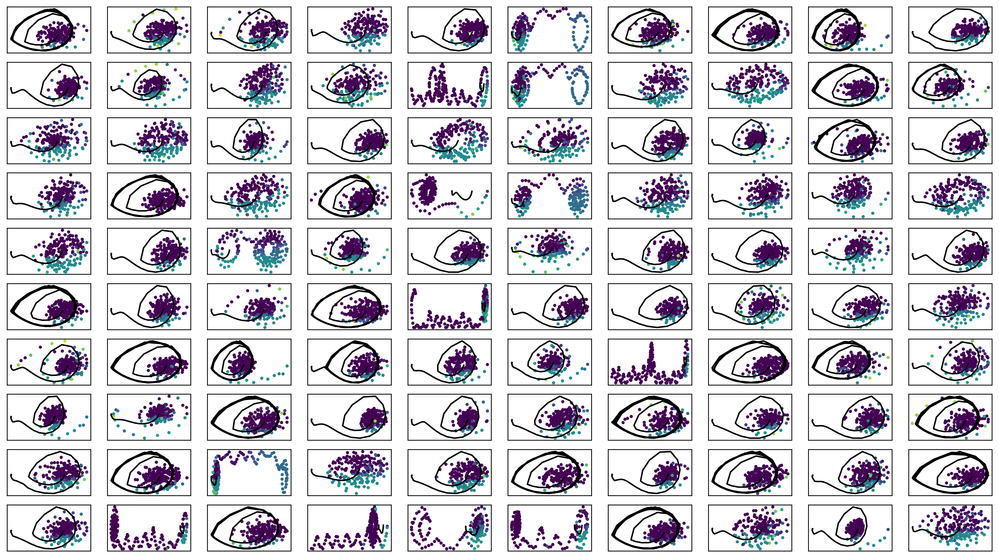

In [56]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter5.png")

In [57]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [58]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


train_weighted_vae: enc_dec
train: iter 0  trainloss -72.09601  validloss -57.49210±0.00000  bestvalidloss -57.49210  last_update 0
train: iter 1  trainloss -75.33590  validloss -54.87194±0.00000  bestvalidloss -57.49210  last_update 1
train: iter 2  trainloss -75.64568  validloss -56.60576±0.00000  bestvalidloss -57.49210  last_update 2
train: iter 3  trainloss -73.46950  validloss -46.39460±0.00000  bestvalidloss -57.49210  last_update 3
train: iter 4  trainloss -74.29937  validloss -52.97099±0.00000  bestvalidloss -57.49210  last_update 4
train: iter 5  trainloss -74.87053  validloss -19.83429±0.00000  bestvalidloss -57.49210  last_update 5
train: iter 6  trainloss -73.90246  validloss -51.61745±0.00000  bestvalidloss -57.49210  last_update 6
train: iter 7  trainloss -76.64279  validloss -49.09214±0.00000  bestvalidloss -57.49210  last_update 7
train: iter 8  trainloss -75.84795  validloss -35.40911±0.00000  bestvalidloss -57.49210  last_update 8
train: iter 9  trainloss -69.19733  

train: iter 78  trainloss -75.29556  validloss -52.89585±0.00000  bestvalidloss -69.01517  last_update 16
train: iter 79  trainloss -76.52498  validloss -43.91495±0.00000  bestvalidloss -69.01517  last_update 17
train: iter 80  trainloss -76.77183  validloss -49.71923±0.00000  bestvalidloss -69.01517  last_update 18
train: iter 81  trainloss -75.87818  validloss -37.75878±0.00000  bestvalidloss -69.01517  last_update 19
train: iter 82  trainloss -74.17357  validloss -43.59089±0.00000  bestvalidloss -69.01517  last_update 20
train: iter 83  trainloss -72.06532  validloss -49.97691±0.00000  bestvalidloss -69.01517  last_update 21
train: iter 84  trainloss -75.23875  validloss -41.44116±0.00000  bestvalidloss -69.01517  last_update 22
train: iter 85  trainloss -74.12336  validloss -34.28232±0.00000  bestvalidloss -69.01517  last_update 23
train: iter 86  trainloss -66.54332  validloss -54.72928±0.00000  bestvalidloss -69.01517  last_update 24
train: iter 87  trainloss -73.02649  validloss

train: iter 155  trainloss -59.75281  validloss -57.98670±0.00000  bestvalidloss -69.01517  last_update 93
train: iter 156  trainloss -59.72416  validloss -63.92279±0.00000  bestvalidloss -69.01517  last_update 94
train: iter 157  trainloss -61.92667  validloss -65.47790±0.00000  bestvalidloss -69.01517  last_update 95
train: iter 158  trainloss -63.03493  validloss -69.66718±0.00000  bestvalidloss -69.66718  last_update 0
train: iter 159  trainloss -63.39210  validloss -65.40985±0.00000  bestvalidloss -69.66718  last_update 1
train: iter 160  trainloss -63.44593  validloss -68.70013±0.00000  bestvalidloss -69.66718  last_update 2
train: iter 161  trainloss -66.01672  validloss -65.68340±0.00000  bestvalidloss -69.66718  last_update 3
train: iter 162  trainloss -66.74491  validloss -67.50561±0.00000  bestvalidloss -69.66718  last_update 4
train: iter 163  trainloss -67.89870  validloss -65.77417±0.00000  bestvalidloss -69.66718  last_update 5
train: iter 164  trainloss -67.29329  valid

train: iter 232  trainloss -76.40282  validloss -55.29635±0.00000  bestvalidloss -71.77794  last_update 63
train: iter 233  trainloss -76.30127  validloss -50.49363±0.00000  bestvalidloss -71.77794  last_update 64
train: iter 234  trainloss -73.85652  validloss -37.07337±0.00000  bestvalidloss -71.77794  last_update 65
train: iter 235  trainloss -74.03149  validloss -51.45820±0.00000  bestvalidloss -71.77794  last_update 66
train: iter 236  trainloss -71.34609  validloss -51.79251±0.00000  bestvalidloss -71.77794  last_update 67
train: iter 237  trainloss -73.44365  validloss -30.74423±0.00000  bestvalidloss -71.77794  last_update 68
train: iter 238  trainloss -75.43099  validloss -39.00764±0.00000  bestvalidloss -71.77794  last_update 69
train: iter 239  trainloss -63.05182  validloss -20.88731±0.00000  bestvalidloss -71.77794  last_update 70
train: iter 240  trainloss -73.01280  validloss -50.66326±0.00000  bestvalidloss -71.77794  last_update 71
train: iter 241  trainloss -74.10523 

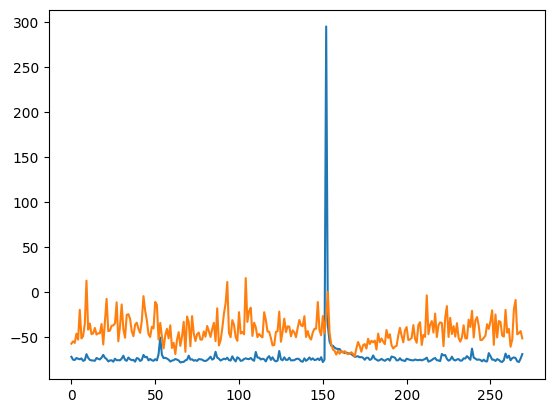

train_weighted_vae: enc
train: iter 0  trainloss -72.27617  validloss -54.31324±0.00000  bestvalidloss -54.31324  last_update 0
train: iter 1  trainloss -73.09433  validloss -43.37054±0.00000  bestvalidloss -54.31324  last_update 1
train: iter 2  trainloss -71.94083  validloss -54.71746±0.00000  bestvalidloss -54.71746  last_update 0
train: iter 3  trainloss -72.50971  validloss -41.40326±0.00000  bestvalidloss -54.71746  last_update 1
train: iter 4  trainloss -72.71087  validloss -42.31899±0.00000  bestvalidloss -54.71746  last_update 2
train: iter 5  trainloss -71.58279  validloss -46.86430±0.00000  bestvalidloss -54.71746  last_update 3
train: iter 6  trainloss -72.19012  validloss -44.05301±0.00000  bestvalidloss -54.71746  last_update 4
train: iter 7  trainloss -71.28422  validloss -40.60633±0.00000  bestvalidloss -54.71746  last_update 5
train: iter 8  trainloss -70.78160  validloss -44.14979±0.00000  bestvalidloss -54.71746  last_update 6
train: iter 9  trainloss -72.45486  vali

train: iter 78  trainloss -72.60685  validloss -52.42486±0.00000  bestvalidloss -57.11578  last_update 35
train: iter 79  trainloss -72.76294  validloss -54.18101±0.00000  bestvalidloss -57.11578  last_update 36
train: iter 80  trainloss -74.21530  validloss -39.07193±0.00000  bestvalidloss -57.11578  last_update 37
train: iter 81  trainloss -73.80573  validloss -42.42337±0.00000  bestvalidloss -57.11578  last_update 38
train: iter 82  trainloss -73.16983  validloss -41.61282±0.00000  bestvalidloss -57.11578  last_update 39
train: iter 83  trainloss -73.57891  validloss -49.35758±0.00000  bestvalidloss -57.11578  last_update 40
train: iter 84  trainloss -73.61739  validloss -45.50407±0.00000  bestvalidloss -57.11578  last_update 41
train: iter 85  trainloss -72.94620  validloss -34.16583±0.00000  bestvalidloss -57.11578  last_update 42
train: iter 86  trainloss -73.09576  validloss -43.99296±0.00000  bestvalidloss -57.11578  last_update 43
train: iter 87  trainloss -73.00770  validloss

train: iter 155  trainloss -72.45107  validloss -40.79269±0.00000  bestvalidloss -61.47882  last_update 51
train: iter 156  trainloss -71.72804  validloss -44.73905±0.00000  bestvalidloss -61.47882  last_update 52
train: iter 157  trainloss -73.44217  validloss -49.83292±0.00000  bestvalidloss -61.47882  last_update 53
train: iter 158  trainloss -72.45764  validloss -50.89936±0.00000  bestvalidloss -61.47882  last_update 54
train: iter 159  trainloss -73.51081  validloss -39.01935±0.00000  bestvalidloss -61.47882  last_update 55
train: iter 160  trainloss -74.05428  validloss -42.87894±0.00000  bestvalidloss -61.47882  last_update 56
train: iter 161  trainloss -73.34978  validloss -40.96163±0.00000  bestvalidloss -61.47882  last_update 57
train: iter 162  trainloss -73.08764  validloss -42.69497±0.00000  bestvalidloss -61.47882  last_update 58
train: iter 163  trainloss -73.21722  validloss -48.48664±0.00000  bestvalidloss -61.47882  last_update 59
train: iter 164  trainloss -71.50012 

train: iter 232  trainloss -72.51012  validloss -35.24830±0.00000  bestvalidloss -61.94256  last_update 55
train: iter 233  trainloss -73.32884  validloss -42.81666±0.00000  bestvalidloss -61.94256  last_update 56
train: iter 234  trainloss -73.69941  validloss -37.04475±0.00000  bestvalidloss -61.94256  last_update 57
train: iter 235  trainloss -73.54820  validloss -50.60260±0.00000  bestvalidloss -61.94256  last_update 58
train: iter 236  trainloss -72.43434  validloss -48.34791±0.00000  bestvalidloss -61.94256  last_update 59
train: iter 237  trainloss -72.38700  validloss -45.76837±0.00000  bestvalidloss -61.94256  last_update 60
train: iter 238  trainloss -73.73562  validloss -39.92547±0.00000  bestvalidloss -61.94256  last_update 61
train: iter 239  trainloss -72.41591  validloss -45.03730±0.00000  bestvalidloss -61.94256  last_update 62
train: iter 240  trainloss -74.06672  validloss -47.80139±0.00000  bestvalidloss -61.94256  last_update 63
train: iter 241  trainloss -72.52799 

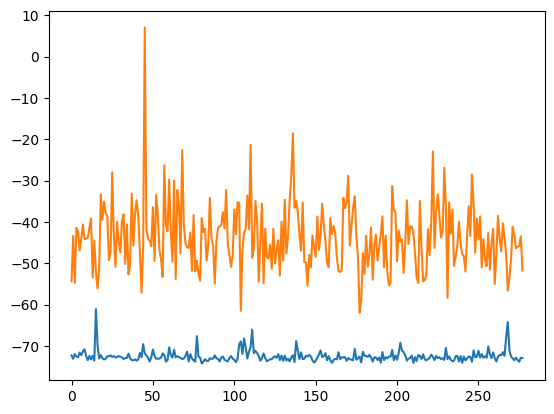

train_weighted_vae: dec
train: iter 0  trainloss -74.69138  validloss -52.53557±0.00000  bestvalidloss -52.53557  last_update 0
train: iter 1  trainloss -75.54966  validloss -38.77578±0.00000  bestvalidloss -52.53557  last_update 1
train: iter 2  trainloss -74.03598  validloss -48.95239±0.00000  bestvalidloss -52.53557  last_update 2
train: iter 3  trainloss -74.12044  validloss -30.77505±0.00000  bestvalidloss -52.53557  last_update 3
train: iter 4  trainloss -76.25758  validloss -34.03257±0.00000  bestvalidloss -52.53557  last_update 4
train: iter 5  trainloss -75.43104  validloss -30.70429±0.00000  bestvalidloss -52.53557  last_update 5
train: iter 6  trainloss -76.27657  validloss -44.16116±0.00000  bestvalidloss -52.53557  last_update 6
train: iter 7  trainloss -76.82209  validloss -36.96918±0.00000  bestvalidloss -52.53557  last_update 7
train: iter 8  trainloss -75.83224  validloss -36.13988±0.00000  bestvalidloss -52.53557  last_update 8
train: iter 9  trainloss -75.79840  vali

train: iter 79  trainloss -75.78816  validloss -34.78509±0.00000  bestvalidloss -52.53557  last_update 79
train: iter 80  trainloss -75.52059  validloss -34.47144±0.00000  bestvalidloss -52.53557  last_update 80
train: iter 81  trainloss -75.83339  validloss -23.67084±0.00000  bestvalidloss -52.53557  last_update 81
train: iter 82  trainloss -75.68238  validloss -42.24290±0.00000  bestvalidloss -52.53557  last_update 82
train: iter 83  trainloss -77.73197  validloss -36.32681±0.00000  bestvalidloss -52.53557  last_update 83
train: iter 84  trainloss -75.40461  validloss -38.83424±0.00000  bestvalidloss -52.53557  last_update 84
train: iter 85  trainloss -76.69390  validloss -39.05848±0.00000  bestvalidloss -52.53557  last_update 85
train: iter 86  trainloss -77.35109  validloss -34.59125±0.00000  bestvalidloss -52.53557  last_update 86
train: iter 87  trainloss -77.53664  validloss -36.45228±0.00000  bestvalidloss -52.53557  last_update 87
train: iter 88  trainloss -75.95538  validloss

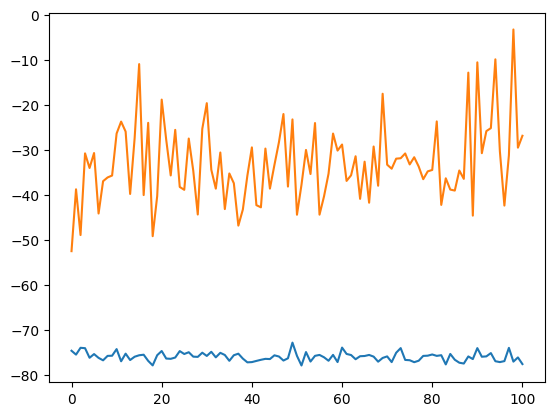

alpha 0.2 vae_lr 0.0005


In [59]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

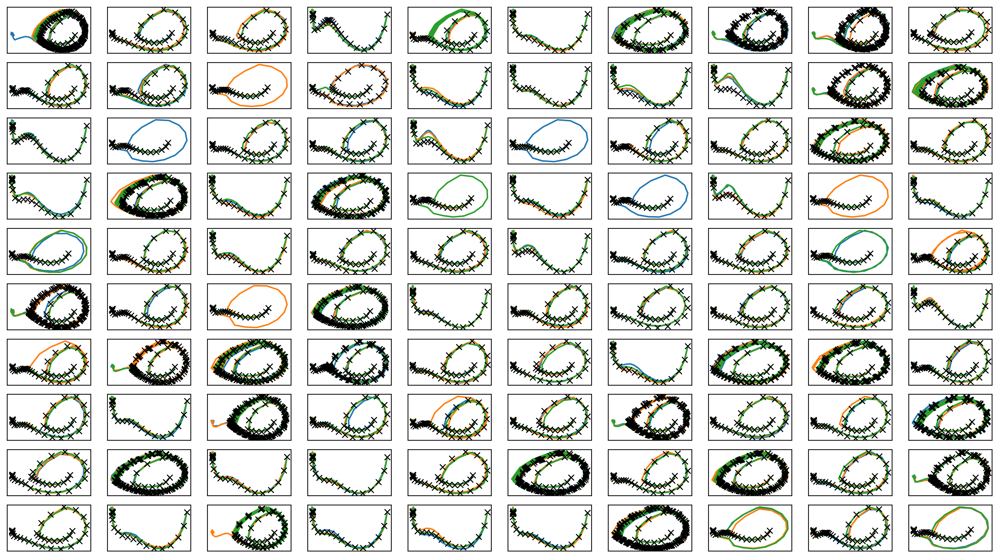

In [60]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter5.png")
plt.savefig(figfilenamehead+"joint_iter5.eps")
plt.savefig(figfilenamehead+"joint_iter5.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

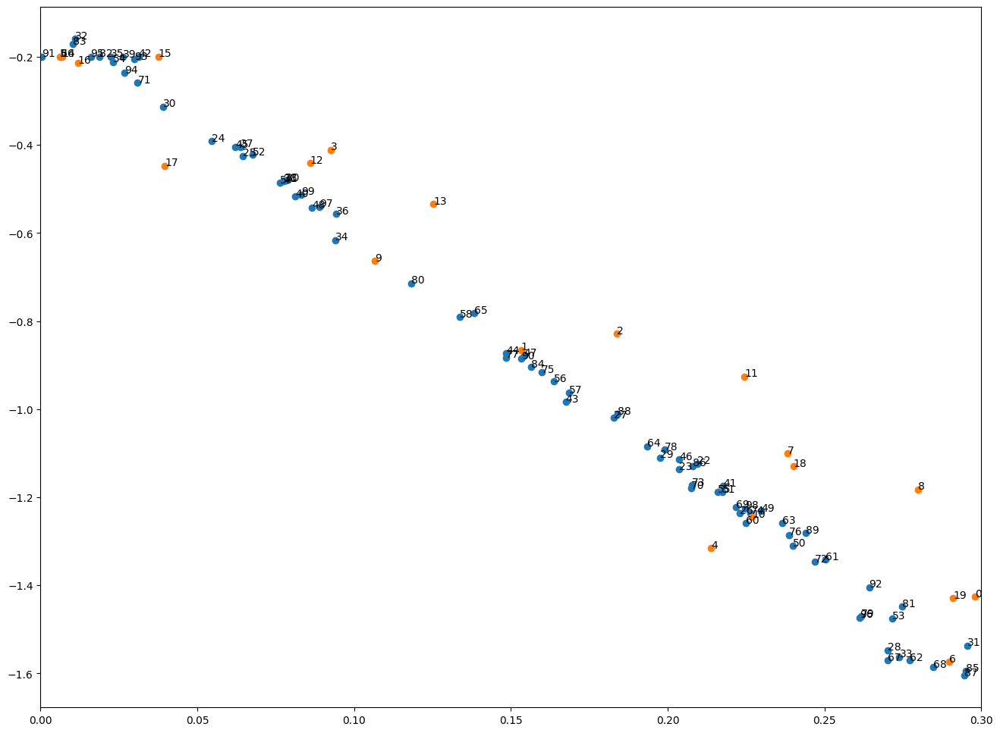

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [61]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter5.png")
plt.savefig(figfilenamehead+"damping_latent_iter5.eps")
plt.savefig(figfilenamehead+"damping_latent_iter5.pdf")

plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [62]:
print(datetime.datetime.now())

2023-03-21 22:14:48.529824


# 評価関数計算

In [63]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [64]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

train: iter 0  trainloss 0.04145  validloss 0.06067±0.00000  bestvalidloss 0.06067  last_update 0
train: iter 1  trainloss 0.03816  validloss 0.05379±0.00000  bestvalidloss 0.05379  last_update 0
train: iter 2  trainloss 0.03808  validloss 0.06549±0.00000  bestvalidloss 0.05379  last_update 1
train: iter 3  trainloss 0.03696  validloss 0.05281±0.00000  bestvalidloss 0.05281  last_update 0
train: iter 4  trainloss 0.03764  validloss 0.05258±0.00000  bestvalidloss 0.05258  last_update 0
train: iter 5  trainloss 0.04068  validloss 0.05031±0.00000  bestvalidloss 0.05031  last_update 0
train: iter 6  trainloss 0.03753  validloss 0.06337±0.00000  bestvalidloss 0.05031  last_update 1
train: iter 7  trainloss 0.03587  validloss 0.05268±0.00000  bestvalidloss 0.05031  last_update 2
train: iter 8  trainloss 0.03633  validloss 0.05157±0.00000  bestvalidloss 0.05031  last_update 3
train: iter 9  trainloss 0.03891  validloss 0.05989±0.00000  bestvalidloss 0.05031  last_update 4
train: iter 10  trai

train: iter 84  trainloss 0.03567  validloss 0.05481±0.00000  bestvalidloss 0.04975  last_update 32
train: iter 85  trainloss 0.03500  validloss 0.05176±0.00000  bestvalidloss 0.04975  last_update 33
train: iter 86  trainloss 0.03504  validloss 0.05470±0.00000  bestvalidloss 0.04975  last_update 34
train: iter 87  trainloss 0.03493  validloss 0.05563±0.00000  bestvalidloss 0.04975  last_update 35
train: iter 88  trainloss 0.03426  validloss 0.05044±0.00000  bestvalidloss 0.04975  last_update 36
train: iter 89  trainloss 0.03518  validloss 0.05225±0.00000  bestvalidloss 0.04975  last_update 37
train: iter 90  trainloss 0.03408  validloss 0.05725±0.00000  bestvalidloss 0.04975  last_update 38
train: iter 91  trainloss 0.03503  validloss 0.05089±0.00000  bestvalidloss 0.04975  last_update 39
train: iter 92  trainloss 0.03398  validloss 0.05304±0.00000  bestvalidloss 0.04975  last_update 40
train: iter 93  trainloss 0.03518  validloss 0.05371±0.00000  bestvalidloss 0.04975  last_update 41


train: iter 167  trainloss 0.03359  validloss 0.05194±0.00000  bestvalidloss 0.04954  last_update 25
train: iter 168  trainloss 0.03340  validloss 0.05611±0.00000  bestvalidloss 0.04954  last_update 26
train: iter 169  trainloss 0.03365  validloss 0.05356±0.00000  bestvalidloss 0.04954  last_update 27
train: iter 170  trainloss 0.03372  validloss 0.05515±0.00000  bestvalidloss 0.04954  last_update 28
train: iter 171  trainloss 0.03349  validloss 0.05342±0.00000  bestvalidloss 0.04954  last_update 29
train: iter 172  trainloss 0.03374  validloss 0.05232±0.00000  bestvalidloss 0.04954  last_update 30
train: iter 173  trainloss 0.03461  validloss 0.05497±0.00000  bestvalidloss 0.04954  last_update 31
train: iter 174  trainloss 0.03402  validloss 0.05517±0.00000  bestvalidloss 0.04954  last_update 32
train: iter 175  trainloss 0.03303  validloss 0.05222±0.00000  bestvalidloss 0.04954  last_update 33
train: iter 176  trainloss 0.03647  validloss 0.05470±0.00000  bestvalidloss 0.04954  last_

train: iter 249  trainloss 0.03248  validloss 0.04891±0.00000  bestvalidloss 0.04869  last_update 48
train: iter 250  trainloss 0.03233  validloss 0.05079±0.00000  bestvalidloss 0.04869  last_update 49
train: iter 251  trainloss 0.03218  validloss 0.05206±0.00000  bestvalidloss 0.04869  last_update 50
train: iter 252  trainloss 0.03233  validloss 0.05308±0.00000  bestvalidloss 0.04869  last_update 51
train: iter 253  trainloss 0.03189  validloss 0.05059±0.00000  bestvalidloss 0.04869  last_update 52
train: iter 254  trainloss 0.03305  validloss 0.05197±0.00000  bestvalidloss 0.04869  last_update 53
train: iter 255  trainloss 0.03292  validloss 0.05601±0.00000  bestvalidloss 0.04869  last_update 54
train: iter 256  trainloss 0.03284  validloss 0.04977±0.00000  bestvalidloss 0.04869  last_update 55
train: iter 257  trainloss 0.03251  validloss 0.04921±0.00000  bestvalidloss 0.04869  last_update 56
train: iter 258  trainloss 0.03191  validloss 0.05486±0.00000  bestvalidloss 0.04869  last_

In [65]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -87.01214147672057
valid_loss:  -28.741845970749853
train_loss:  -57.472498198151584
valid_loss:  -31.447847133874895


In [66]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=100)


train: iter 0  trainloss 9.69186  validloss 10.76747±0.00000  bestvalidloss 10.76747  last_update 0
train: iter 1  trainloss 8.68268  validloss 9.62325±0.00000  bestvalidloss 9.62325  last_update 0
train: iter 2  trainloss 7.81533  validloss 8.60845±0.00000  bestvalidloss 8.60845  last_update 0
train: iter 3  trainloss 7.07767  validloss 7.81987±0.00000  bestvalidloss 7.81987  last_update 0
train: iter 4  trainloss 6.46714  validloss 7.11555±0.00000  bestvalidloss 7.11555  last_update 0
train: iter 5  trainloss 5.92370  validloss 6.49891±0.00000  bestvalidloss 6.49891  last_update 0
train: iter 6  trainloss 5.45604  validloss 5.96241±0.00000  bestvalidloss 5.96241  last_update 0
train: iter 7  trainloss 5.05858  validloss 5.48803±0.00000  bestvalidloss 5.48803  last_update 0
train: iter 8  trainloss 4.67970  validloss 5.10313±0.00000  bestvalidloss 5.10313  last_update 0
train: iter 9  trainloss 4.35939  validloss 4.75279±0.00000  bestvalidloss 4.75279  last_update 0
train: iter 10  tr

train: iter 85  trainloss 0.69123  validloss 0.68833±0.00000  bestvalidloss 0.68511  last_update 1
train: iter 86  trainloss 0.68231  validloss 0.68516±0.00000  bestvalidloss 0.68511  last_update 2
train: iter 87  trainloss 0.67595  validloss 0.68717±0.00000  bestvalidloss 0.68511  last_update 3
train: iter 88  trainloss 0.67253  validloss 0.68127±0.00000  bestvalidloss 0.68127  last_update 0
train: iter 89  trainloss 0.66918  validloss 0.67124±0.00000  bestvalidloss 0.67124  last_update 0
train: iter 90  trainloss 0.65802  validloss 0.66917±0.00000  bestvalidloss 0.66917  last_update 0
train: iter 91  trainloss 0.65854  validloss 0.67432±0.00000  bestvalidloss 0.66917  last_update 1
train: iter 92  trainloss 0.66391  validloss 0.65654±0.00000  bestvalidloss 0.65654  last_update 0
train: iter 93  trainloss 0.65753  validloss 0.63620±0.00000  bestvalidloss 0.63620  last_update 0
train: iter 94  trainloss 0.66300  validloss 0.64870±0.00000  bestvalidloss 0.63620  last_update 1
train: ite

train: iter 170  trainloss 0.64742  validloss 0.63581±0.00000  bestvalidloss 0.62265  last_update 35
train: iter 171  trainloss 0.64713  validloss 0.66657±0.00000  bestvalidloss 0.62265  last_update 36
train: iter 172  trainloss 0.65119  validloss 0.65244±0.00000  bestvalidloss 0.62265  last_update 37
train: iter 173  trainloss 0.64263  validloss 0.63215±0.00000  bestvalidloss 0.62265  last_update 38
train: iter 174  trainloss 0.64606  validloss 0.63838±0.00000  bestvalidloss 0.62265  last_update 39
train: iter 175  trainloss 0.64124  validloss 0.65446±0.00000  bestvalidloss 0.62265  last_update 40
train: iter 176  trainloss 0.63784  validloss 0.64567±0.00000  bestvalidloss 0.62265  last_update 41
train: iter 177  trainloss 0.63932  validloss 0.64378±0.00000  bestvalidloss 0.62265  last_update 42
train: iter 178  trainloss 0.63839  validloss 0.65609±0.00000  bestvalidloss 0.62265  last_update 43
train: iter 179  trainloss 0.64447  validloss 0.63697±0.00000  bestvalidloss 0.62265  last_

train: iter 261  trainloss 0.63841  validloss 0.64586±0.00000  bestvalidloss 0.61130  last_update 48
train: iter 262  trainloss 0.64249  validloss 0.63873±0.00000  bestvalidloss 0.61130  last_update 49
train: iter 263  trainloss 0.64354  validloss 0.65043±0.00000  bestvalidloss 0.61130  last_update 50
train: iter 264  trainloss 0.63944  validloss 0.65312±0.00000  bestvalidloss 0.61130  last_update 51
train: iter 265  trainloss 0.64598  validloss 0.63822±0.00000  bestvalidloss 0.61130  last_update 52
train: iter 266  trainloss 0.65160  validloss 0.64242±0.00000  bestvalidloss 0.61130  last_update 53
train: iter 267  trainloss 0.64798  validloss 0.63752±0.00000  bestvalidloss 0.61130  last_update 54
train: iter 268  trainloss 0.65175  validloss 0.63504±0.00000  bestvalidloss 0.61130  last_update 55
train: iter 269  trainloss 0.65116  validloss 0.64092±0.00000  bestvalidloss 0.61130  last_update 56
train: iter 270  trainloss 0.63997  validloss 0.63855±0.00000  bestvalidloss 0.61130  last_

In [67]:
print(iwvi.initial_belief)
iwvi.save()

Parameter containing:
tensor([-0.8969, -1.5510], requires_grad=True)


In [68]:
loss_array = np.array(loss_list)

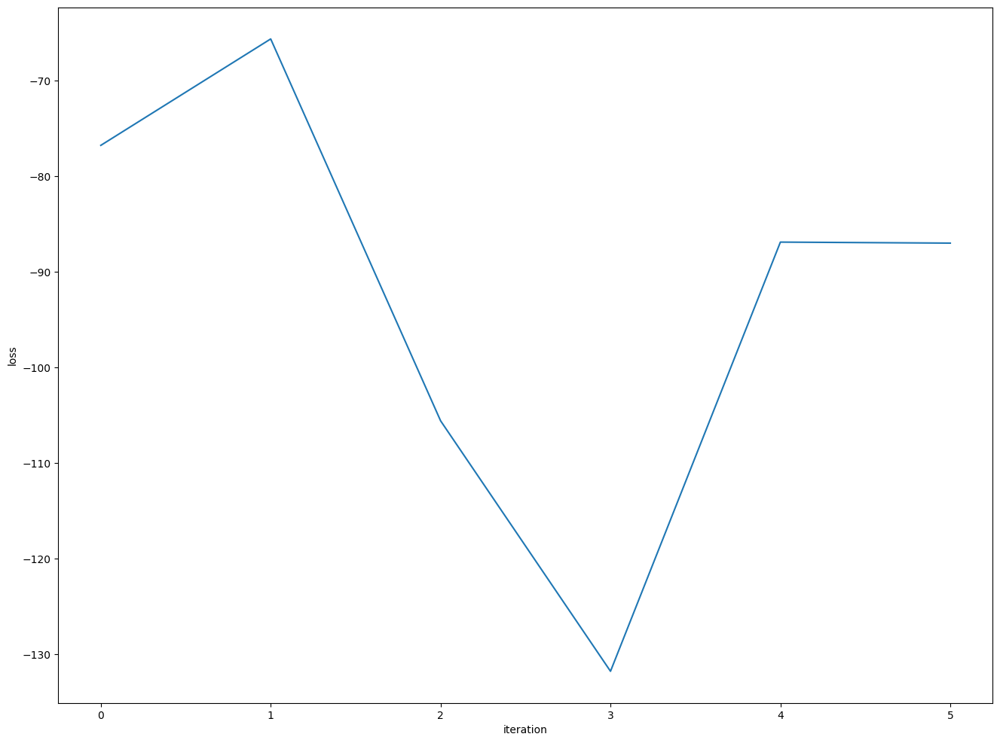

In [69]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.png")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.eps")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

Text(0, 0.5, 'loss')

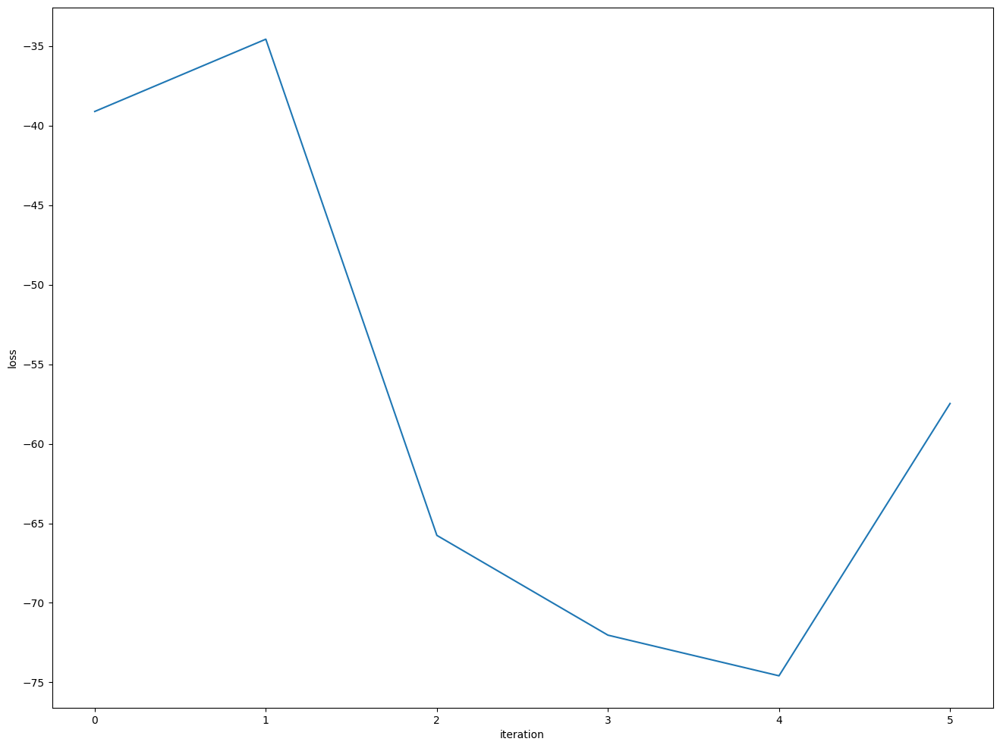

In [70]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")